# Data preparation

## Data Sources:
1. 


In [ ]:
%load_ext autoreload
%autoreload 2

import csv
import numpy as np
import pandas as pd

import geopandas as gpd
import fiona
import shapely

import matplotlib.pyplot as plt
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
# params
src = r"../../20 Data/"

### Load and print data

<Axes: >

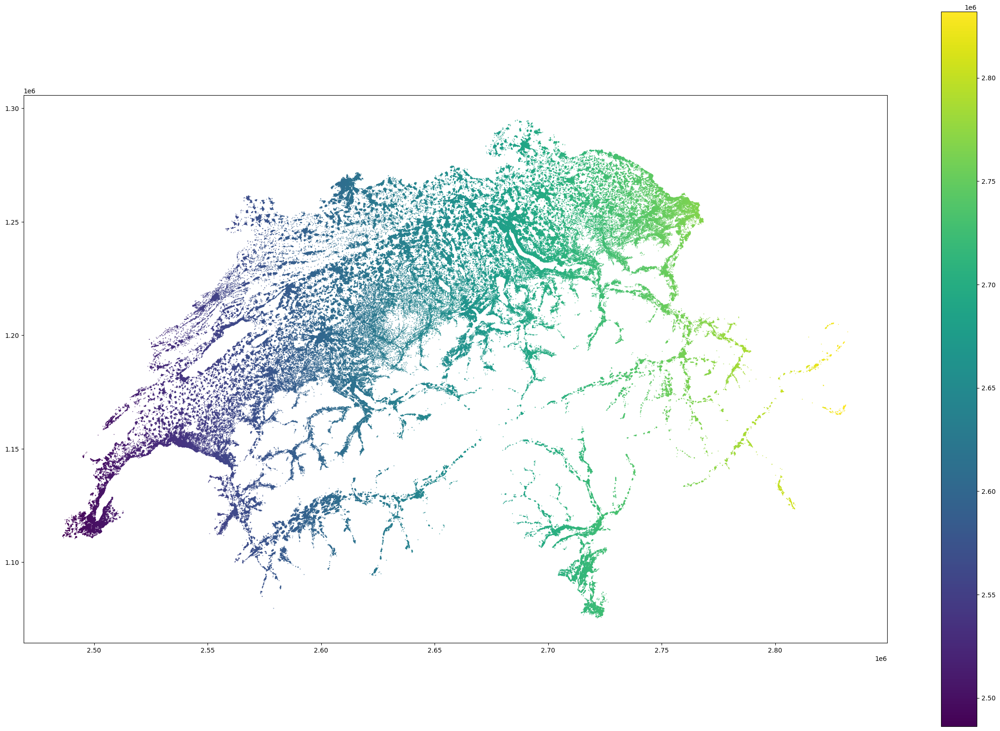

In [48]:
datapop = pd.read_csv(src + "ag-b-00.03-vz2022statpop/STATPOP2022.csv", sep = ";")
geopop = gpd.GeoDataFrame(datapop, geometry= gpd.points_from_xy(datapop.E_KOORD, datapop.N_KOORD))
# pop = gpd.GeoDataFrame
geopop.plot(column = "E_KOORD", cmap = "viridis", markersize = 0.1, figsize = (30, 20), legend = True)

<Axes: >

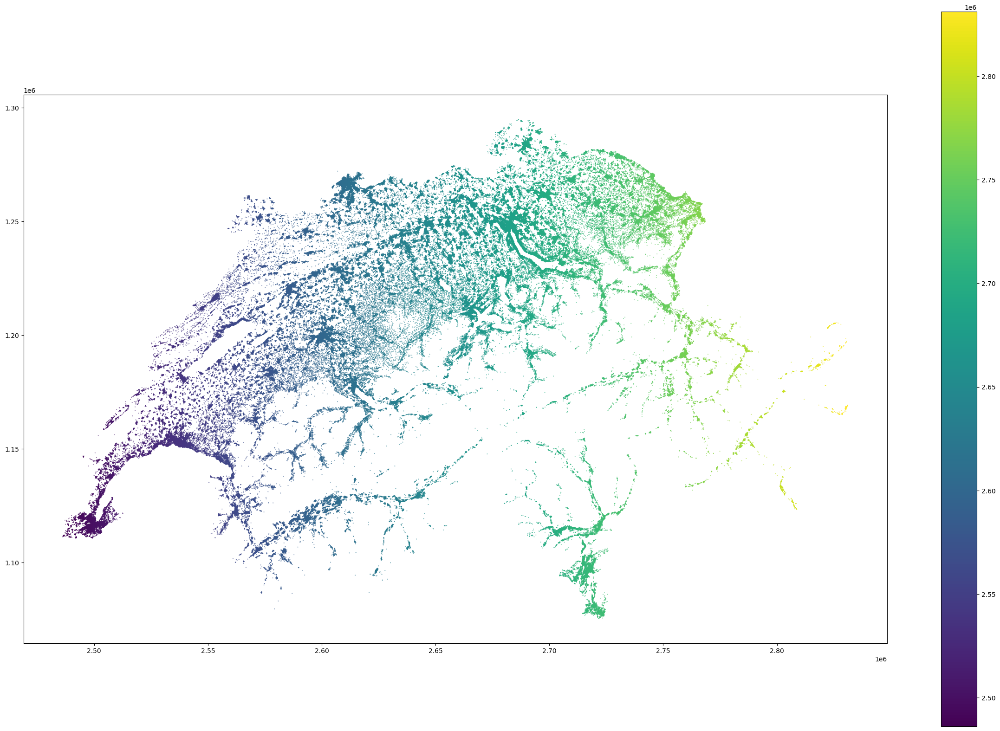

In [51]:
dataent = pd.read_csv(src + "ag-b-00.03-22-STATENT2022/STATENT_2022.csv", sep = ";")
dataent.head()
geoent = gpd.GeoDataFrame(dataent, geometry= gpd.points_from_xy(dataent.E_KOORD, dataent.N_KOORD))
geoent.plot(column = "E_KOORD", cmap = "viridis", markersize = 0.1, figsize = (30, 20), legend = True)

C:\Users\furio\AppData\Local\Temp\ipykernel_10368\2383768827.py:1: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  datapvm = pd.read_csv(src + "av_lv95/csv/av/osnr.csv", sep = ";")


<Axes: >

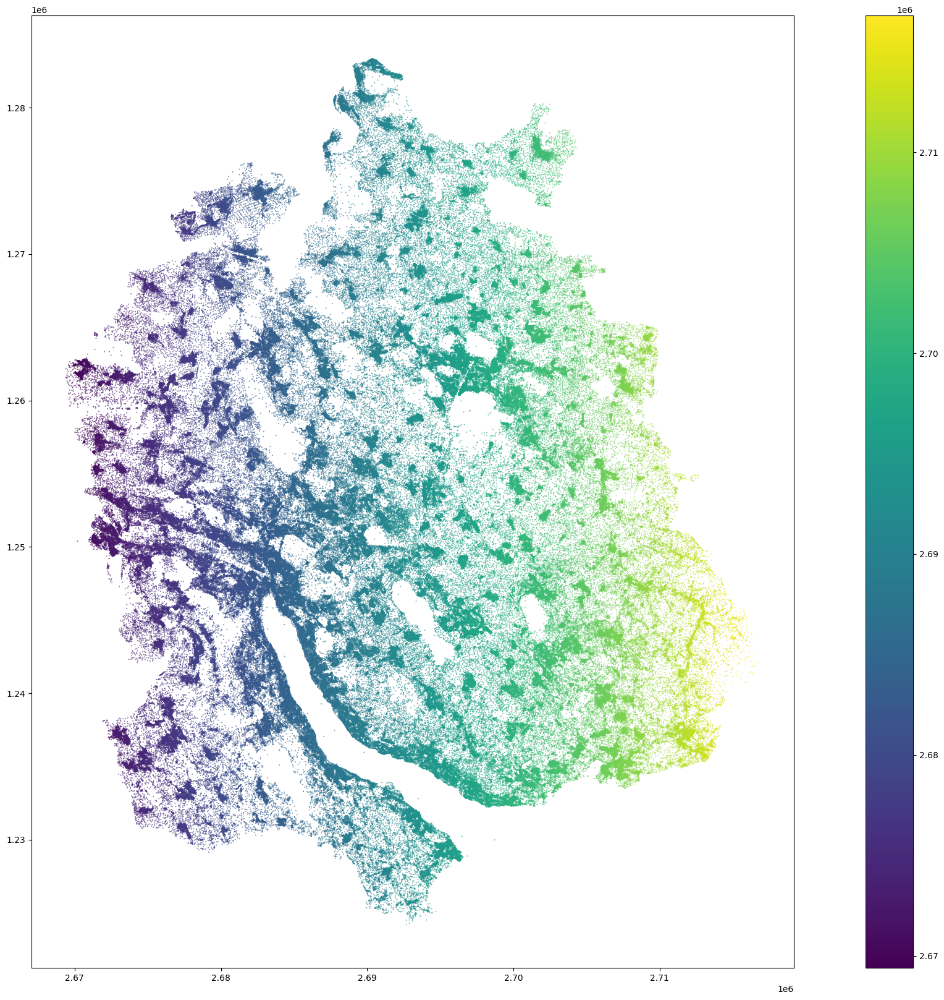

In [105]:
datapvm = pd.read_csv(src + "av_lv95/csv/av/osnr.csv", sep = ";")
datapvm.head()
geopvm = gpd.GeoDataFrame(datapvm, geometry= gpd.points_from_xy(datapvm.E, datapvm.N))
geopvm.plot(column = "E", cmap = "viridis", markersize = 0.1, figsize = (30, 20), legend = True)

In [138]:
_ = src + "av_lv95/geopackage/av_lv95.gpkg"
fiona.listlayers(_)

['cppt',
 'dprsf',
 'dprsfproj',
 'hadr',
 'lcobj',
 'lcsf',
 'lcsfproj',
 'lnna',
 'locpos',
 'mbsf',
 'osbp',
 'osnr',
 'osnrproj',
 'plli',
 'plna',
 'plsf',
 'resf',
 'resfhl',
 'resfproj',
 'slide',
 'slideobj',
 'soli',
 'soobj',
 'sopt',
 'sosf',
 'tbbp',
 'tbli']

In [154]:
georoa = gpd.read_file(src + "av_lv95/geopackage/av_lv95.gpkg", layer = "soli") # roads
geolcf = gpd.read_file(src + "av_lv95/geopackage/av_lv95.gpkg", layer = "lcsf") # roads
# geocad.hplot(figsize = (30, 20));

In [151]:
print(geocad.Art.unique())

['uebriger_Gebaeudeteil' 'unterirdisches_Gebaeude'
 'Tunnel_Unterfuehrung_Galerie' 'wichtige_Treppe' 'Mauer' 'Mast_Antenne'
 'Bruecke_Passerelle' 'Hochspannungsfreileitung' 'Achse' 'schmaler_Weg'
 'Rinnsal' 'Ruine_archaeologisches_Objekt' 'Bahngeleise'
 'Silo_Turm_Gasometer' 'eingedoltes_oeffentliches_Gewaesser' 'Schwelle'
 'weitere' 'Pfeiler' 'Druckleitung' 'Aussichtsturm' 'massiver_Sockel'
 'Brunnen' 'Skilift' 'Reservoir' 'Denkmal' 'Bahnsteig' 'Uferverbauung'
 'Materialseilbahn' 'Unterstand' 'Faehre' 'Luftseilbahn']


In [ ]:
_ = src + "swissBOUNDARIES3D_1_5_LV95_LN02.gdb/"
fiona.listlayers(_)

C:\Users\furio\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\pyogrio\raw.py:198: RuntimeWarning: driver OpenFileGDB does not support open option DRIVER
  return ogr_read(


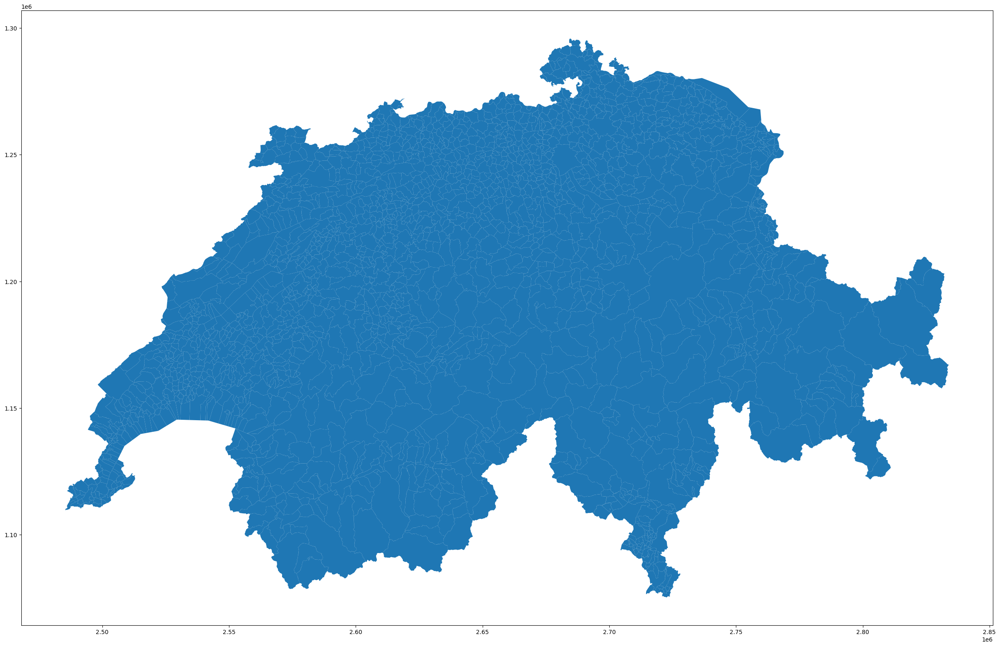

In [96]:
geobrd = gpd.read_file(src + "swissBOUNDARIES3D_1_5_LV95_LN02.gdb/",  driver='FileGDB', layer = "TLM_HOHEITSGEBIET")
geobrd.plot(figsize = (30, 20));

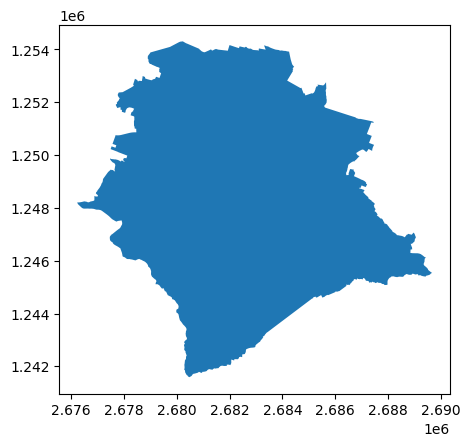

In [ ]:
geozhc = geobrd.loc[geobrd.BFS_NUMMER == 261] # selecting Zuerich geometry to simplify the experiment
geozhc.plot();

## Geometries within the municipality Zuerich

In [152]:
geopopzh = gpd.sjoin(geopop, geozhc, how='inner', predicate='within')
geopopzh = geopopzh.drop(['index_right'], axis=1)
geoentzh = gpd.sjoin(geoent, geozhc, how='inner', predicate='within')
geoentzh = geoentzh.drop(['index_right'], axis=1)
geocadzh = gpd.sjoin(geocad, geozhc, how='inner', predicate='within')
geocadzh = geocadzh.drop(['index_right'], axis=1)


# geopopzh.plot(column = "E_KOORD", cmap = "viridis", markersize = 3, figsize = (30, 20), legend = True);

C:\Users\furio\AppData\Local\Temp\ipykernel_10368\142367031.py:1: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: COMPD_CS["CH1903+ / LV95 + LN02 height",PROJCS["CH ...

  geopopzh = gpd.sjoin(geopop, geozhc, how='inner', predicate='within')
C:\Users\furio\AppData\Local\Temp\ipykernel_10368\142367031.py:3: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: COMPD_CS["CH1903+ / LV95 + LN02 height",PROJCS["CH ...

  geoentzh = gpd.sjoin(geoent, geozhc, how='inner', predicate='within')
C:\Users\furio\AppData\Local\Temp\ipykernel_10368\142367031.py:5: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of t

C:\Users\furio\AppData\Local\Temp\ipykernel_10368\10359959.py:1: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:2056
Right CRS: COMPD_CS["CH1903+ / LV95 + LN02 height",PROJCS["CH ...

  geolcfzh = gpd.sjoin(geolcf, geozhc, how='inner', predicate='within')


<Axes: >

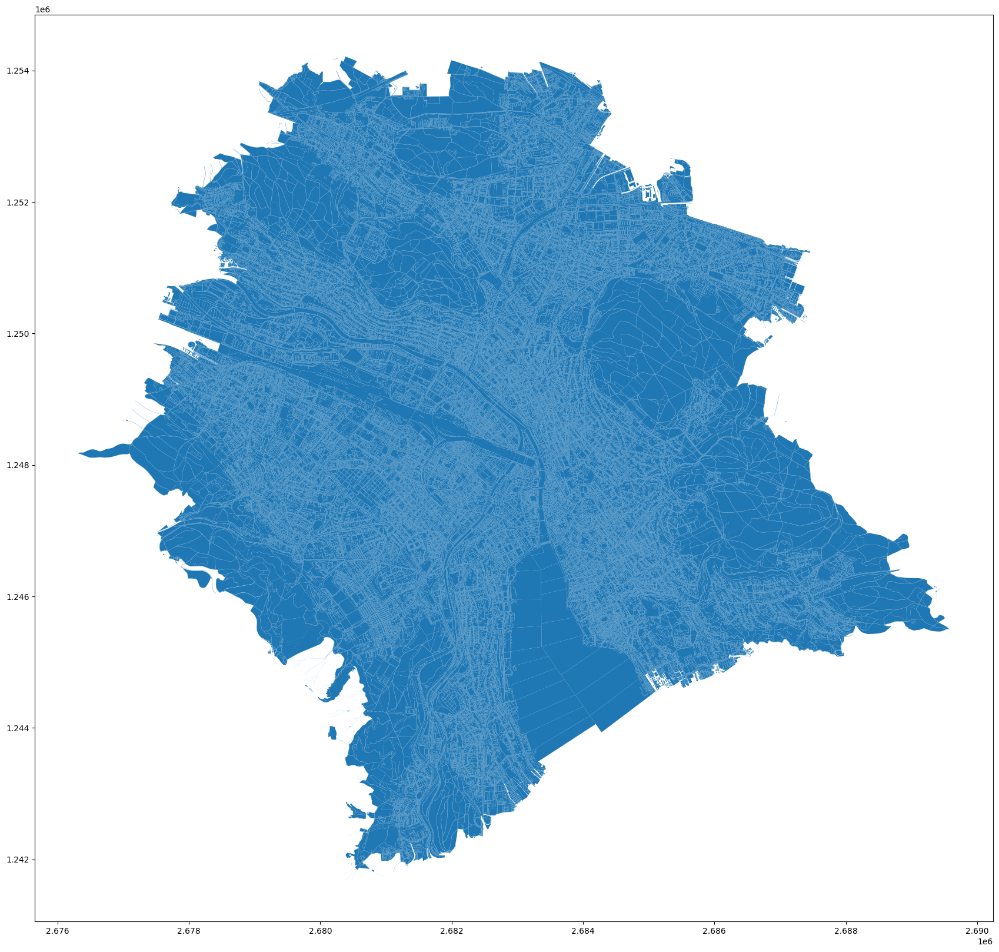

In [155]:

geolcfzh = gpd.sjoin(geolcf, geozhc, how='inner', predicate='within')
geolcfzh = geolcfzh.drop(['index_right'], axis=1)
geolcfzh.plot(figsize = (30,20))

In [ ]:
geolcfzh.Art.unique() # all pavements

array(['Trottoir', 'Gartenanlage', 'uebrige_humusierte', 'Gebaeude',
       'uebrige_befestigte', 'Reben', 'Bahn', 'uebrige_bestockte',
       'Acker_Wiese_Weide', 'uebrige_Intensivkultur', 'Hoch_Flachmoor',
       'Schilfguertel', 'geschlossener_Wald', 'Wasserbecken', 'Flugplatz',
       'Verkehrsinsel', 'Gewaesser_fliessendes', 'Gewaesser_stehendes',
       'Strasse_Weg'], dtype=object)

<Axes: >

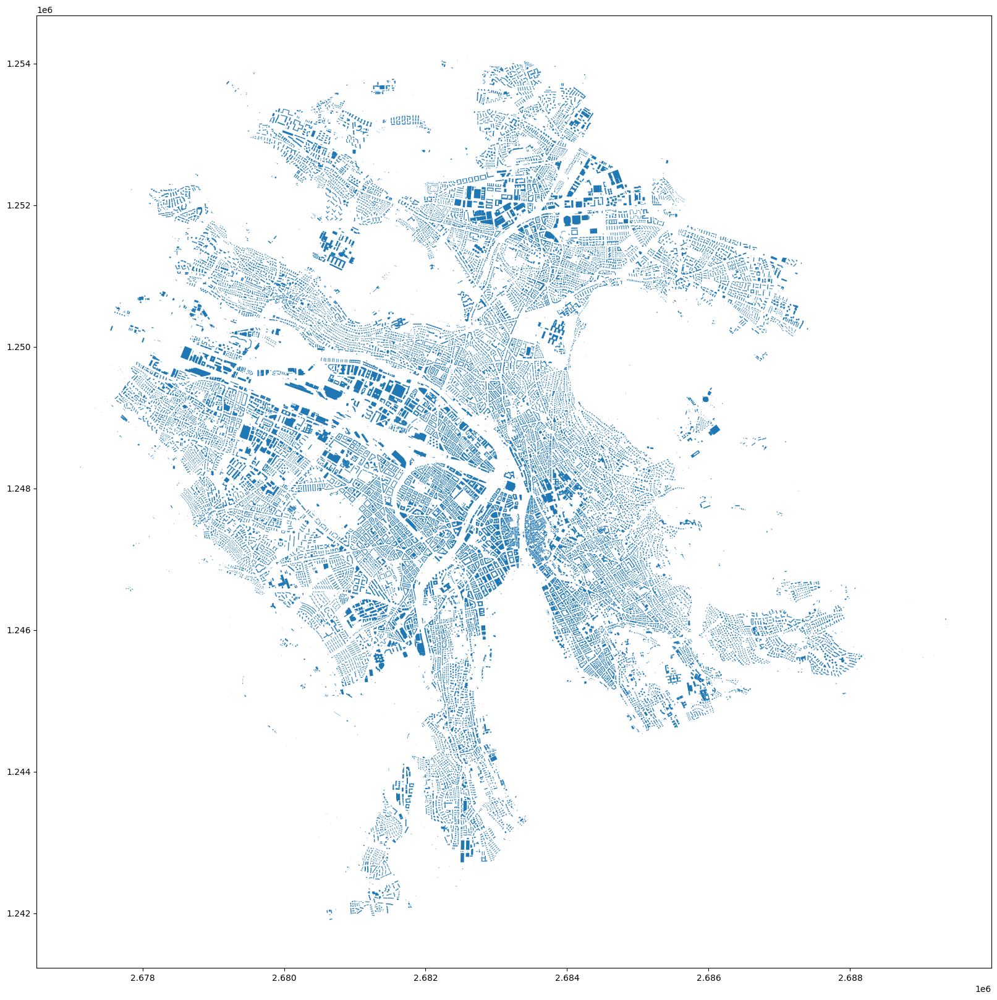

In [162]:
geobldzh = geolcfzh.loc[geolcfzh.Art == "Gebaeude"]# all buildings
geowaszh = geolcfzh.loc[(geolcfzh.Art == "Hoch_Flachmoor") | (geolcfzh.Art == "Wasserbecken") | 
(geolcfzh.Art == "Schilfguertel") | 
                        (geolcfzh.Art == "Gewaesser_fliessendes") | (geolcfzh.Art == "Gewaesser_stehendes") ] # all water
geogrnzh = geolcfzh.loc[(geolcfzh.Art == "Gartenanlage") | (geolcfzh.Art == "uebrige_humusierte") | 
                        (geolcfzh.Art == "Reben") | (geolcfzh.Art == "uebrige_bestockte") | 
                        (geolcfzh.Art == "Acker_Wiese_Weide") | (geolcfzh.Art == "uebrige_Intensivkultur") |
                        (geolcfzh.Art == "uebrige_Intensivkultur") | (geolcfzh.Art == "geschlossener_Wald") |
                        (geolcfzh.Art == "geschlossener_Wald")]# all green areas
geohrdzh = geolcfzh.loc[(geolcfzh.Art == "Trottoir") | (geolcfzh.Art == "Bahn") |
                        (geolcfzh.Art == "Flugplatz") | (geolcfzh.Art == "Verkehrsinsel") |
                        (geolcfzh.Art == "Strasse_Weg")]# all hard non-building surfaces

geobldzh.plot(figsize = (30,20))

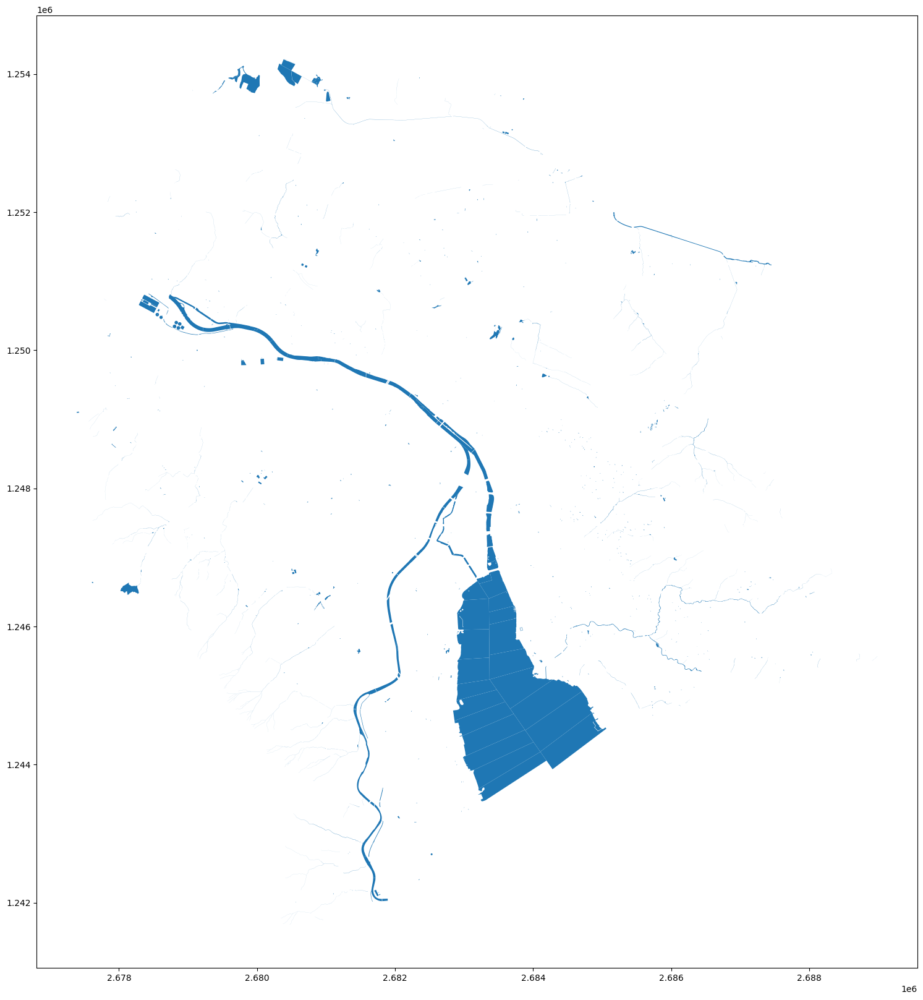

In [165]:
# geocadzh.plot(figsize = (30,20)); # only infrastructure
# geohrdzh.plot(figsize = (30,20)); # only hard surfaces
# geogrnzh.plot(figsize = (30,20)); # only green areas
geowaszh.plot(figsize = (30,20)); # only water areas

In [124]:
geopopzh.shape

(4446, 106)

In [125]:
geoentzh.shape

(4474, 678)

In [128]:
geozh = gpd.sjoin(geopopzh, geoentzh, how='inner', predicate='intersects')

In [ ]:
# CHECHING THE OVERLAPPUNG OF THE POINTS MANUALLY

popne = geopopzh.reset_index()[['E_KOORD', 'N_KOORD']].values.tolist()
entne = geoentzh.reset_index()[['E_KOORD', 'N_KOORD']].values.tolist()

counter = 0
for e in popne:
    if e in entne:
        counter +=1
print(f'point in pop with same coordinates as points in ent: {counter}')


point in pop with same coordinates as points in ent: 4033


In [186]:
print(geozh.shape)
print(f"manual check: {counter} ||| sjoin: {geozh.shape[0]} ||| difference: {counter - geozh.shape[0]}")

(4033, 784)
manual check: 4033 ||| sjoin: 4033 ||| difference: 0


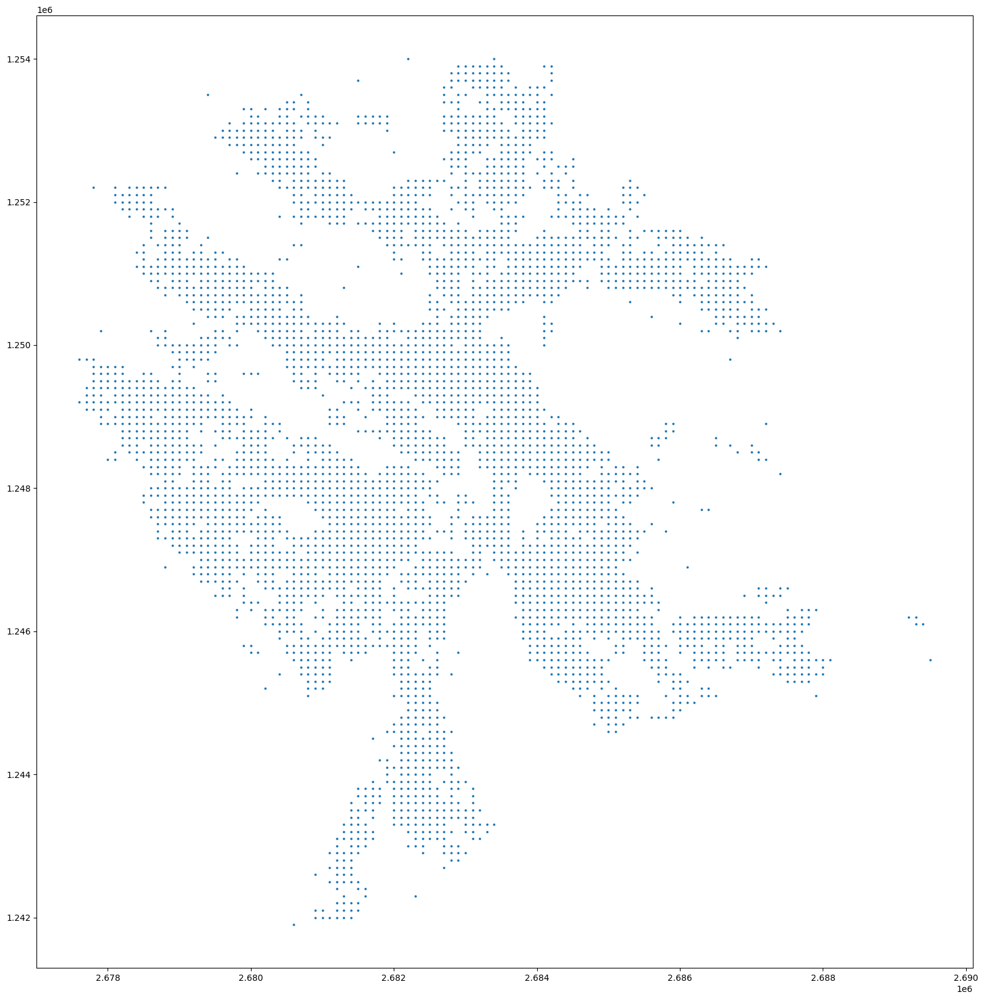

In [132]:
geozh.plot(markersize = 3, figsize = (30, 20), legend = True);

In [190]:
geozh.E_KOORD_left.unique()
print("EVERY POINT IS 100 m DISTANT FROM THE NEXT ONE")

EVERY POINT IS 100 m DISTANT FROM THE NEXT ONE


## SET CRS - (coordinate reference system)

In [272]:
geozh = geozh.set_crs('epsg:2056')

## ENRICH ZURICH DATA

In [194]:
max_e = max(geozh.E_KOORD_left.unique())
min_e = min(geozh.E_KOORD_left.unique())
max_n = max(geozh.N_KOORD_left.unique())
min_n = min(geozh.N_KOORD_left.unique())

In [192]:
max_e

np.int64(2689500)

<Axes: >

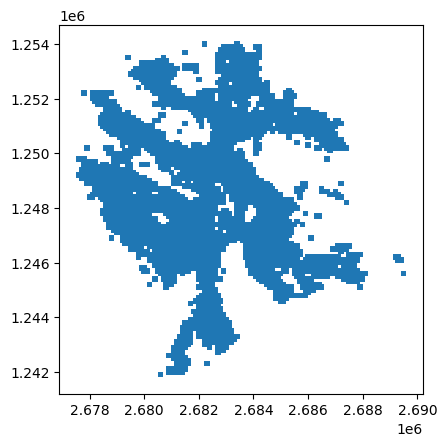

In [206]:
# creating squares of influence around the points:
geozh_grid = geozh.buffer(100, cap_style = 3)
geozh_grid.plot()


In [ ]:
# Estimate values for features

def get_cad_feats(target: gpd.GeoDataFrame, bld: gpd.GeoDataFrame):
    # create output as Series
    bld_nmb = pd.Series(index=target.index)
    bld_area_tot = pd.Series(index=target.index)
    bld_area_mean = pd.Series(index=target.index)
    bld_area_std = pd.Series(index=target.index)
    bld_peri_mean = pd.Series(index=target.index)
    bld_peri_std = pd.Series(index=target.index)
    bld_len_mean = pd.Series(index=target.index)
    bld_len_std = pd.Series(index=target.index)
    bld_wdt_mean = pd.Series(index=target.index) 
    bld_wdt_std = pd.Series(index=target.index)

    # add values for feats
    for i,f in target.iterrows():
        g = f.geometry
        g = g.buffer(50, cap_style = 3)
        intersected_blds_idx = geobldzh.geometry.intersects(g)
        intersected_blds = geobldzh[intersected_blds_idx]
        bld_nmb[i] = intersected_blds_idx.sum()
        bld_area_tot_value = 0 # output 2
        bld_area_lst = []
        bld_per_lst = []
        bld_len_lst = []
        bld_wdt_lst = []
        for k, building in intersected_blds.iterrows():
            b = building.geometry
            bld_area_tot_value += b.intersection(g).area # intersected area
            bld_area_lst.append(b.area) # entire area
            box = shapely.oriented_envelope(b) 
            x,y = box.exterior.coords.xy
            edge_length = (shapely.Point(x[0], y[0]).distance(shapely.Point(x[1], y[1])), shapely.Point(x[1], y[1]).distance(shapely.Point(x[2], y[2])))
            length, width = max(edge_length), min(edge_length)
            bld_len_lst.append(length)
            bld_wdt_lst.append(width)
            bld_per_lst.append(b.length)
        bld_area_tot[i] = bld_area_tot_value # output 2
        bld_area_mean[i] = np.mean(bld_area_lst) # output 3
        bld_area_std[i] = np.std(bld_area_lst) # output 4
        bld_peri_mean[i] = np.mean(bld_per_lst) # output 5
        bld_peri_std[i] = np.std(bld_per_lst) # output 6
        bld_len_mean[i] = np.mean(bld_len_lst) # output 7
        bld_len_std[i] = np.std(bld_len_lst) # output 8
        bld_wdt_mean[i] = np.mean(bld_wdt_lst) # output 9
        bld_wdt_std[i] = np.std(bld_wdt_lst) # output 10

get_cad_feats(geozh, geobldzh)

48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
48731
4873

In [356]:
new_col = pd.Series(index=geozh.index )
new_col

223490   NaN
223492   NaN
223643   NaN
223644   NaN
223645   NaN
          ..
242891   NaN
243104   NaN
243105   NaN
243320   NaN
243547   NaN
Length: 4033, dtype: float64

In [371]:
# bld_counter=0
# bld_counter_list = []
bld_nmb = pd.Series(index=geozh.index)
bld_area_tot = pd.Series(index=geozh.index)
bld_area_mean = pd.Series(index=geozh.index)
bld_area_std = pd.Series(index=geozh.index)
bld_peri_mean = pd.Series(index=geozh.index)
bld_peri_std = pd.Series(index=geozh.index)
bld_len_mean = pd.Series(index=geozh.index)
bld_len_std = pd.Series(index=geozh.index)
bld_wdt_mean = pd.Series(index=geozh.index) 
bld_wdt_std = pd.Series(index=geozh.index)


for i,f in geozh.iterrows():
    g = f.geometry
    g = g.buffer(50, cap_style = 'square')
    intersected_blds_idx = geobldzh.geometry.intersects(g)# (bld, g, how="inner", predicate="intersects")
    intersected_blds = geobldzh[intersected_blds_idx]
    bld_nmb[i] = intersected_blds_idx.sum() # output 1
    bld_area_tot_value = 0 # output 2
    bld_area_lst = []
    bld_per_lst = []
    bld_len_lst = []
    bld_wdt_lst = []
    for k, building in intersected_blds.iterrows():
        b = building.geometry
        bld_area_tot_value += b.intersection(g).area # intersected area
        bld_area_lst.append(b.area) # entire area
        box = shapely.oriented_envelope(b) 
        x,y = box.exterior.coords.xy
        edge_length = (shapely.Point(x[0], y[0]).distance(shapely.Point(x[1], y[1])), shapely.Point(x[1], y[1]).distance(shapely.Point(x[2], y[2])))
        length, width = max(edge_length), min(edge_length)
        bld_len_lst.append(length)
        bld_wdt_lst.append(width)
        bld_per_lst.append(b.length)
    bld_area_tot[i] = bld_area_tot_value # output 2
    bld_area_mean[i] = np.mean(bld_area_lst) # output 3
    bld_area_std[i] = np.std(bld_area_lst) # output 4
    bld_peri_mean[i] = np.mean(bld_per_lst) # output 5
    bld_peri_std[i] = np.std(bld_per_lst) # output 6
    bld_len_mean[i] = np.mean(bld_len_lst) # output 7
    bld_len_std[i] = np.std(bld_len_lst) # output 8
    bld_wdt_mean[i] = np.mean(bld_wdt_lst) # output 9
    bld_wdt_std[i] = np.std(bld_wdt_lst) # output 10
    # print(f'intersected buildings: {intersected_blds_idx.sum()}')
    # bld_counter_list.append(intersected_blds_idx.sum())
    # print(intersected_blds.shape[0])

# print(bld_counter)

C:\Users\furio\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\numpy\_core\fromnumeric.py:3904: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\furio\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\numpy\_core\_methods.py:147: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\furio\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\numpy\_core\_methods.py:227: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\furio\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\numpy\_core\_methods.py:184: RuntimeWarning: invalid value 

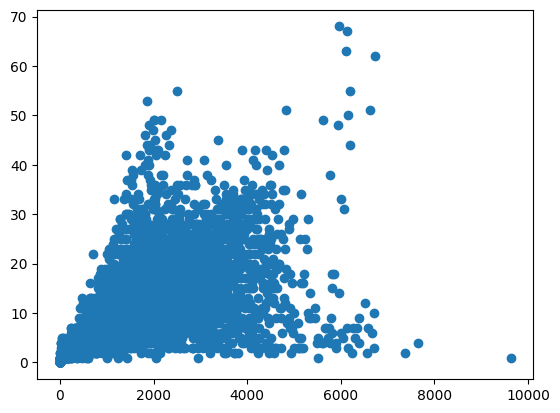

In [ ]:
plt.scatter(bld_area_tot, bld_nmb);

In [ ]:
f = geozh.iloc[123]
g = f.geometry
g = g.buffer(50, cap_style = 'square')
intersected_blds_idx = geobldzh.geometry.intersects(g)# (bld, g, how="inner", predicate="intersects")
intersected_blds = geobldzh[intersected_blds_idx]
bld_nmb = intersected_blds_idx.sum() # output 1
bld_area_tot = 0 # output 2
bld_area_lst = []
bld_per_lst = []
bld_len_lst = []
bld_wdt_lst = []
for k, building in intersected_blds.iterrows():
    b = building.geometry
    bld_area_tot += b.intersection(g).area # intersected area
    bld_area_lst.append(b.area) # entire area
    box = shapely.oriented_envelope(b) 
    x,y = box.exterior.coords.xy
    edge_length = (shapely.Point(x[0], y[0]).distance(shapely.Point(x[1], y[1])), shapely.Point(x[1], y[1]).distance(shapely.Point(x[2], y[2])))
    length, width = max(edge_length), min(edge_length)
    bld_len_lst.append(length)
    bld_wdt_lst.append(width)
    bld_per_lst.append(b.length)
bld_area_mean = np.mean(bld_area_lst) # output 3
bld_area_std = np.std(bld_area_lst) # output 4
bld_peri_mean = np.mean(bld_per_lst) # output 5
bld_peri_std = np.std(bld_per_lst) # output 6
bld_len_mean = np.mean(bld_len_lst) # output 7
bld_len_std = np.std(bld_len_lst) # output 8
bld_wdt_mean = np.mean(bld_wdt_lst) # output 9
bld_wdt_std = np.std(bld_wdt_lst) # output 10

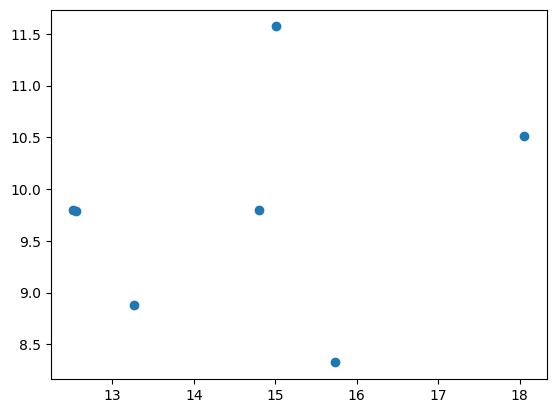

In [355]:
plt.scatter(bld_len_lst, bld_wdt_lst);

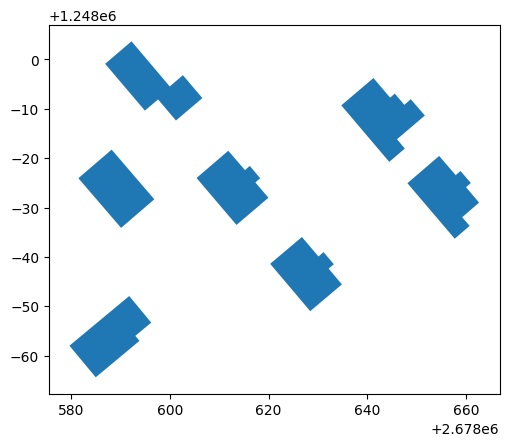

In [308]:
intersected_blds.plot();

(array([ 799., 1261., 1186.,  514.,  168.,   63.,   26.,   10.,    2.,
           4.]),
 array([ 0. ,  6.8, 13.6, 20.4, 27.2, 34. , 40.8, 47.6, 54.4, 61.2, 68. ]),
 <BarContainer object of 10 artists>)

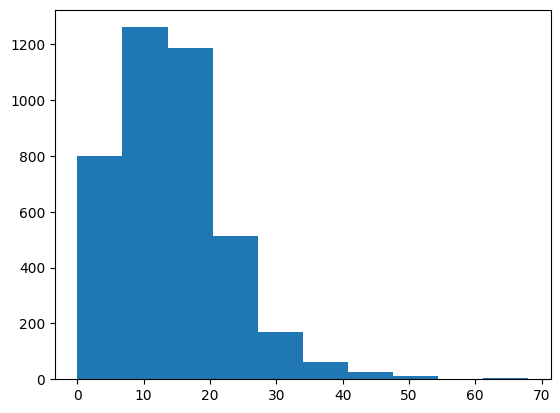

In [296]:
plt.hist(bld_counter_list)

In [294]:
geozh.iloc[0].geometry.buffer(50, cap_style = 'square').area

10000.0

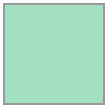

In [281]:
geozh.iloc[0].geometry.buffer(50, cap_style = 'square')

In [269]:
geozh = geozh.set_crs('epsg:2056')

In [275]:
geobldzh.crs

<Projected CRS: EPSG:2056>
Name: CH1903+ / LV95
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Liechtenstein; Switzerland.
- bounds: (5.96, 45.82, 10.49, 47.81)
Coordinate Operation:
- name: Swiss Oblique Mercator 1995
- method: Hotine Oblique Mercator (variant B)
Datum: CH1903+
- Ellipsoid: Bessel 1841
- Prime Meridian: Greenwich